In [1]:
import os
import time
import subprocess
import numpy as np
import matplotlib.pyplot as plt

import nibabel as nib

from nipype import Node
from nipype.interfaces import spm

import nilearn as nl
from nilearn.plotting import plot_glass_brain, view_img

np.set_printoptions(precision=3, suppress=True)

start_time = time.time()

201212-08:14:28,489 nipype.utils WARNING:
	 A newer version (1.5.1) of nipy/nipype is available. You are using 1.5.0-rc1.post-dev


In [2]:
matlab_cmd = '/opt/spm12-r7219/run_spm12.sh /opt/matlabmcr-2010a/v713/ script'
spm.SPMCommand.set_mlab_paths(matlab_cmd=matlab_cmd, use_mcr=True)

In [3]:
base_dir = subprocess.check_output('pwd').decode()[:-1] + '/'
base_dir

'/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/'

In [173]:
paradigm_name = 'verbs'
conditions=['verbs', 'blablabla', 'words', 'ding', 'listen', 'whatdo', 'silence']
onsets=[[35, 132, 269], [62, 159, 326], [5, 219, 299], [0, 30, 60, 87, 127, 157, 184, 214, 244, 264, 294, 324, 351],
       [2, 216, 296], [32, 129, 266], [89, 186, 246]]
durations=[[25, 25, 25], [25, 25, 25], [25, 25, 25], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [3,3,3], [3,3,3], [3,3,3]]

contrast = [
    (conditions[0], 'T', [conditions[0],conditions[1],conditions[1]], \
                         #conditions[3],conditions[4],conditions[5],conditions[6]], \
                         [2,-2, -1, -0.1,-0.1,-0.1,-0.1]),
    #(conditions[1], 'T', [conditions[0],conditions[1],conditions[2]], [0,1,0]),
    #(conditions[2], 'T', [conditions[0],conditions[1],conditions[2]], [0,0,1])
            ]
contrast_to_estimate = 1

beta_images = ['beta_000' + str(i) + '.nii' for i in range(1, len(conditions)+2)]

stat_image = 'spmT_000%s.nii'%str(contrast_to_estimate)
thr_image = stat_image[:-4] + '_pre_topo_thr.nii'
height_threshold = 0.05


fmri_dicom_folder = paradigm_name + '_dicom'
fmri_nii_folder = paradigm_name + '_func'
t1_dicom_folder = 't1_dicom'

smoothing_kernel = [4, 4, 4]

In [174]:
print(beta_images)
print(contrast)
print(stat_image)
print(thr_image)

['beta_0001.nii', 'beta_0002.nii', 'beta_0003.nii', 'beta_0004.nii', 'beta_0005.nii', 'beta_0006.nii', 'beta_0007.nii', 'beta_0008.nii']
[('verbs', 'T', ['verbs', 'blablabla', 'blablabla'], [2, -2, -1, -0.1, -0.1, -0.1, -0.1])]
spmT_0001.nii
spmT_0001_pre_topo_thr.nii


In [157]:
t1_dicom_files = [os.path.join(base_dir, t1_dicom_folder, i) for i in os.listdir(t1_dicom_folder) if i.endswith('dcm')]

fmri_dicom_files = [os.path.join(base_dir, fmri_dicom_folder, i) for i in os.listdir(fmri_dicom_folder) if i.endswith('dcm')]

In [158]:
t1_dicom_files[:5]

['/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/t1_dicom/IMG-0001-00001.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/t1_dicom/IMG-0001-00002.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/t1_dicom/IMG-0001-00003.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/t1_dicom/IMG-0001-00004.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/t1_dicom/IMG-0001-00005.dcm']

In [159]:
fmri_dicom_files[:5]

['/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/verbs_dicom/IMG-0001-00001.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/verbs_dicom/IMG-0001-00002.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/verbs_dicom/IMG-0001-00003.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/verbs_dicom/IMG-0001-00004.dcm',
 '/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/verbs_dicom/IMG-0001-00005.dcm']

In [160]:
t1_import = spm.DicomImport()
t1_import.overwrite = False
t1_import.inputs.in_files = t1_dicom_files
t1_import.inputs.output_dir = base_dir

In [ ]:
t1_import_res = t1_import.run()

In [ ]:
fmri_import = spm.DicomImport()
fmri_import.overwrite = False
fmri_import.inputs.in_files = fmri_dicom_files
fmri_import.inputs.output_dir = os.path.join(base_dir, fmri_nii_folder)

In [12]:
%%time
fmri_import_res = fmri_import.run()

CPU times: user 237 ms, sys: 67.4 ms, total: 304 ms
Wall time: 12min 52s


In [13]:
fmri_all_nii_files = [os.path.join(fmri_nii_folder, i) for i in os.listdir(fmri_nii_folder)]

In [14]:
realign = spm.Realign()
realign.inputs.register_to_mean = True
realign.inputs.jobtype = 'estwrite'
realign.inputs.in_files = fmri_all_nii_files[10:] #Возможный инпут: fmri_import_res.outputs.out_files[10:]

In [15]:
realign_res = realign.run()

In [16]:
t1_filename = [i for i in os.listdir() if i.startswith('s') and i.endswith('1.nii')][0]
t1_filename

'sGIL160288-0003-00001-000001-01.nii'

In [17]:
t1_raw = nib.load(t1_filename)

In [18]:
%%capture 
#Вылетают требовния сконвертировать данные в uint8, отключаю их. Все и так работает. 
import imageio
images = []
for file in realign_res.outputs.realigned_files:
    fmri = nib.load(file)
    fmri_array = fmri.get_fdata()
    images.append(fmri_array[:,:,30])
    
imageio.mimwrite('animation.gif', images, duration=0.1)

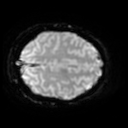

<Figure size 864x864 with 0 Axes>

In [19]:
from IPython.display import Image
plt.figure(figsize=(12,12))
Image(filename="animation.gif", width=200)

In [20]:
smooth = spm.Smooth()
smooth.base_dir = base_dir
smooth.inputs.fwhm = smoothing_kernel
smooth.inputs.in_files = realign_res.outputs.realigned_files

In [21]:
smooth_res = smooth.run()

In [22]:
print("Все произошло за %.2f минуты." % ((time.time() - start_time)/60))

Все произошло за 18.96 минуты.


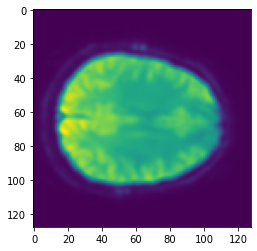

In [23]:
plt.imshow(nib.load(smooth_res.outputs.smoothed_files[0]).get_fdata()[:,:,25])

In [24]:
len(smooth_res.outputs.smoothed_files)

144

In [25]:
from nipype.algorithms import modelgen
from nipype.interfaces.base import Bunch

In [175]:
model = modelgen.SpecifyModel()

model.inputs.input_units = 'secs'
model.inputs.functional_runs = [[base_dir + i for i in smooth_res.outputs.smoothed_files]]

model.inputs.time_repetition = 25
model.inputs.high_pass_filter_cutoff = 128

In [176]:
evs_run = Bunch(conditions=conditions, 
                onsets=onsets, 
                durations=durations)
model.inputs.subject_info = [evs_run]

In [177]:
model_results = model.run()

In [178]:
model_results.outputs.session_info

[{'cond': [{'name': 'verbs',
    'onset': [35.0, 132.0, 269.0],
    'duration': [25.0, 25.0, 25.0]},
   {'name': 'blablabla',
    'onset': [62.0, 159.0, 326.0],
    'duration': [25.0, 25.0, 25.0]},
   {'name': 'words',
    'onset': [5.0, 219.0, 299.0],
    'duration': [25.0, 25.0, 25.0]},
   {'name': 'ding',
    'onset': [0.0,
     30.0,
     60.0,
     87.0,
     127.0,
     157.0,
     184.0,
     214.0,
     244.0,
     264.0,
     294.0,
     324.0,
     351.0],
    'duration': [2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0,
     2.0]},
   {'name': 'listen',
    'onset': [2.0, 216.0, 296.0],
    'duration': [3.0, 3.0, 3.0]},
   {'name': 'whatdo',
    'onset': [32.0, 129.0, 266.0],
    'duration': [3.0, 3.0, 3.0]},
   {'name': 'silence',
    'onset': [89.0, 186.0, 246.0],
    'duration': [3.0, 3.0, 3.0]}],
  'hpf': 128.0,
  'regress': [],
  'scans': ['/home/neuro/nipype_tutorial/Code/GUBSKIY_I.L/verbs_func/srsGIL160

In [179]:
rm SPM.mat #Удаляю остатки предыдущей итерации, иначе бывают странные лаги. 

In [180]:
level1design = spm.Level1Design()

level1design.inputs.timing_units = 'secs'
level1design.inputs.session_info = model_results.outputs.session_info
level1design.inputs.interscan_interval = 2.5
level1design.inputs.bases = {'hrf':{'derivs': [0,0]}}
level1design.inputs.flags = {'mthresh': 0.8}
level1design.inputs.microtime_resolution = 16
level1design.inputs.microtime_onset = 8

In [181]:
level1design_res = level1design.run()

In [182]:
est_model = spm.EstimateModel()
est_model.inputs.spm_mat_file = 'SPM.mat'
est_model.inputs.estimation_method = {'Classical': 1}
est_model.run() 

In [183]:
est_contrast = spm.EstimateContrast()
est_contrast.inputs.beta_images = beta_images
est_contrast.inputs.residual_image = 'ResMS.nii'
est_contrast.inputs.spm_mat_file = 'SPM.mat'

contrast = contrast

est_contrast.inputs.contrasts = contrast
est_contrast.run()

In [184]:
thresh = spm.Threshold()
thresh.inputs.spm_mat_file = 'SPM.mat'
thresh.inputs.stat_image = stat_image
thresh.inputs.extent_threshold = 10
thresh.inputs.contrast_index = contrast_to_estimate
thresh.inputs.height_threshold = height_threshold
thresh.inputs.height_threshold = 0.05
thresh.inputs.use_fwe_correction = True
thresh.run() 

/opt/miniconda-latest/envs/neuro/lib/python3.6/site-packages/nilearn/plotting/html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



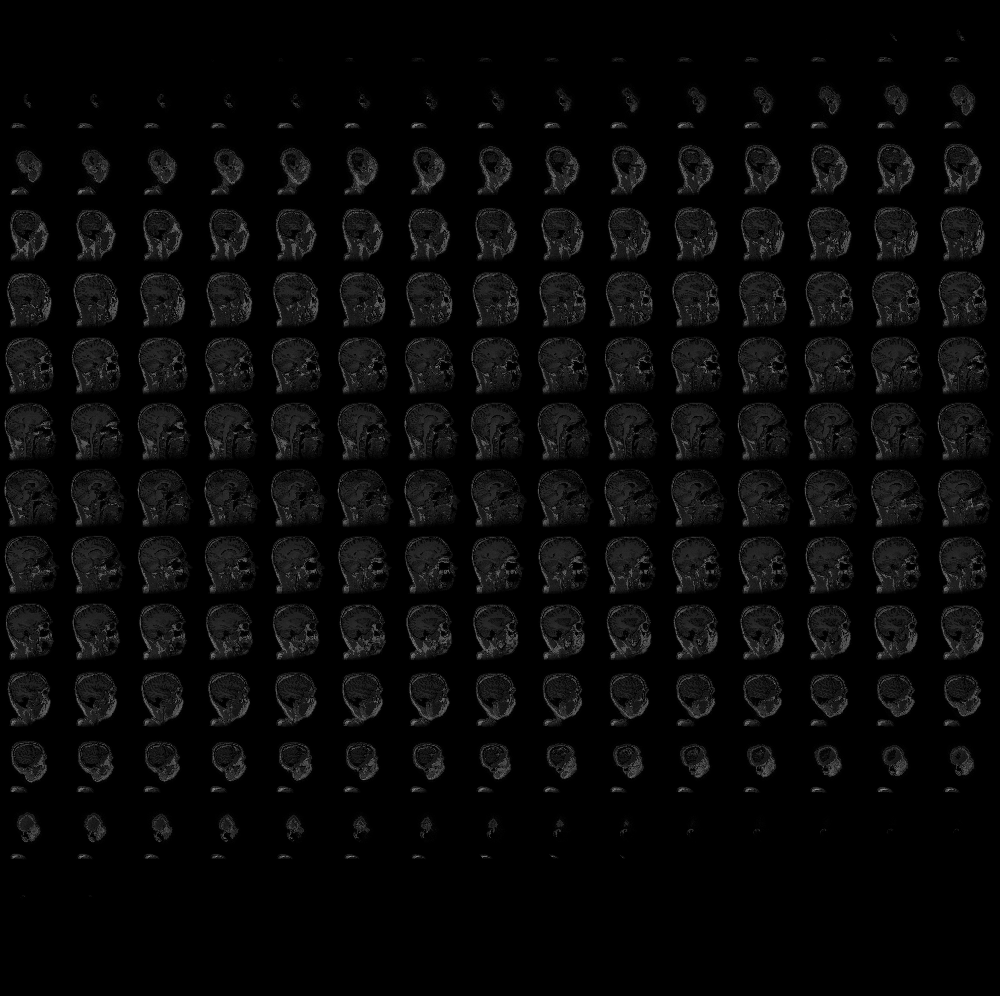
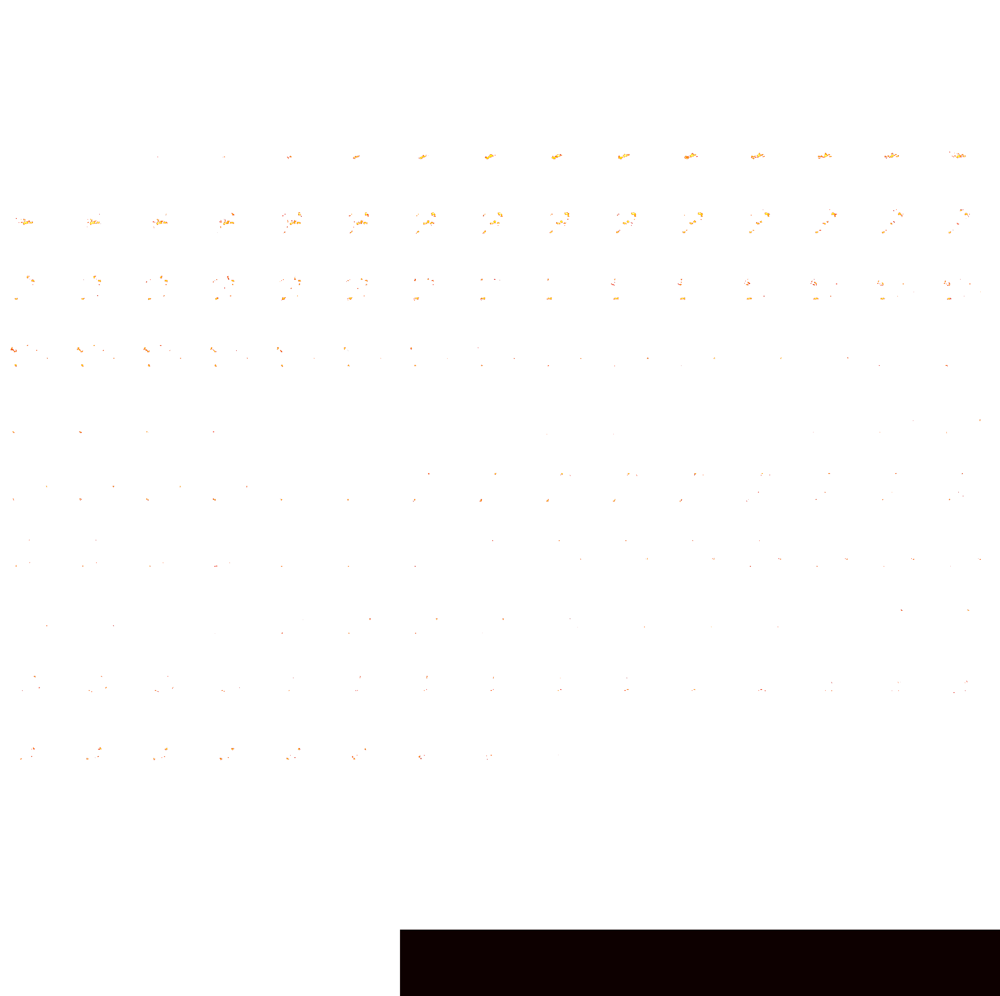

In [185]:
view_img(stat_map_img=thr_image, bg_img=t1_raw, opacity=0.7, dim=1)

In [37]:
coregistration = spm.Coregister()
coregistration.inputs.jobtype = 'estwrite'
coregistration.inputs.target = t1_filename
coregistration.inputs.source = fmri_all_nii_files[9]
coregistration.inputs.apply_to_files = thr_image
coregistration_res = coregistration.run()

In [38]:
t1_raw_array = t1_raw.get_fdata()

In [39]:
fmri = nib.load('r' + thr_image)
fmri_array = fmri.get_fdata()
fmri_without_nan = nib.Nifti1Image(np.nan_to_num(fmri_array), fmri.affine, fmri.header)
fmri_without_nan_array = fmri_without_nan.get_fdata()

In [40]:
nib.save(fmri_without_nan, 'fmri_resampled.nii')

In [41]:
fmri_without_nan_array.max() #Просто проверяю, что в массиве не одни нули

8.361977577209473

In [42]:
#Я умножаю карту активаций на тысячу, чтобы ее было видно на фоне Т1. 
combo = t1_raw_array + fmri_without_nan_array * t1_raw_array.max()/fmri_without_nan_array.max()

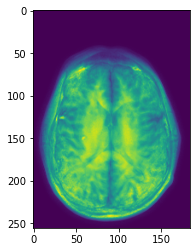

In [43]:
plt.imshow(combo[:,-90:-40,:].mean(axis=1))

In [44]:
t1 = nib.Nifti1Image(combo, t1_raw.affine, t1_raw.header)
nib.save(t1, 't1_' + paradigm_name + '.nii')

Экспорт реализован через SimpleITK. Просто берем сырой срез Т1, берем из него метаданные, пиксельную матрицу подставляем из только что сделанного размеченного Т1, и записываем это в файл.  

In [45]:
!pip install simpleitk tqdm -q

In [46]:
import SimpleITK as sitk
from tqdm import tqdm

In [47]:
series_IDs =  sitk.ImageSeriesReader().GetGDCMSeriesIDs(t1_dicom_folder)
series_file_names =  sitk.ImageSeriesReader().GetGDCMSeriesFileNames(t1_dicom_folder, series_IDs[0])

In [48]:
image_reader = sitk.ImageFileReader()
image_reader.LoadPrivateTagsOn()
image_list = []
for file_name in series_file_names:
    image_reader.SetFileName(file_name)
    image_list.append(image_reader.Execute())

In [49]:
sitk_t1 = sitk.GetImageFromArray(combo)

sitk_t1.SetDirection(image_list[0].GetDirection())

writer = sitk.ImageFileWriter()
writer.KeepOriginalImageUIDOn()

modification_time = time.strftime("%H%M%S")
modification_date = time.strftime("%Y%m%d")

In [50]:
import subprocess
try:
    subprocess.run(["mkdir", paradigm_name + "_mapped_dicom"])
except:
    pass

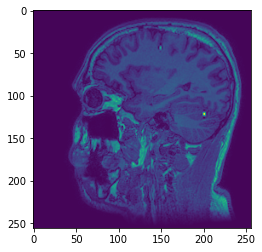

In [51]:
plt.imshow(sitk.GetArrayFromImage(sitk_t1[::,::-1,::][60,:,:]).T)

In [52]:
for i in tqdm(range(len(image_list))):
    #Да, мне стыдно за такой костыль, отстаньте.  
    image_slice = sitk.GetArrayFromImage(sitk_t1[::,::-1,::][i,:,:]).T
    image_slice = sitk.GetImageFromArray(image_slice)
    original_slice = image_list[i]
    
    for k in original_slice.GetMetaDataKeys():
        #if k!="0028|1052" and k!= "0028|1053":
            image_slice.SetMetaData(k, original_slice.GetMetaData(k))

    
    image_slice.SetMetaData("0010|0010", "Name, %s"%paradigm_name)
    image_slice.SetMetaData("0010|0020", "Modified ID")
    image_slice.SetMetaData("0020|000e", "Mapped " + modification_date + ".1" + modification_time)
    
    writer.SetFileName(paradigm_name + "_mapped_dicom" + '/' + os.listdir(t1_dicom_folder)[i])
    writer.Execute(image_slice)
print('Всё.')

100%|██████████| 184/184 [00:13<00:00, 13.22it/s]

Всё.


In [53]:
print("Все произошло за %.2f минуты." % ((time.time() - start_time)/60))

Все произошло за 22.70 минуты.


Чтобы делать дайкомы с извлеченным мозгом: